# Make Artificial Songs

In [1]:
from starling_rhythm.utils.paths import PROCESSED_DIR, ensure_dir
from starling_rhythm import synth

In [2]:
bID = 's_b1555_22'

In [3]:
bID_DIR = PROCESSED_DIR / bID
SEG_DIR = bID_DIR / 'segments'

In [4]:
SEG_DIR

PosixPath('/mnt/cube/j8xing/starling_rhythm_mfdfa/data/s_b1555_22/segments')

In [5]:
seg_list = list(SEG_DIR.glob('*.wav'))

In [6]:
test = [
    [1], 
    [3, 5], 
    [2, 583, 23],
    [4]
]

In [7]:
test.sort()

In [8]:
test

[[1], [2, 583, 23], [3, 5], [4]]

## Import label data

In [9]:
import pandas as pd

In [10]:
syllable_df = list(bID_DIR.glob('syllable_df.pickle'))[0]
syllable_df = pd.read_pickle(syllable_df)

In [11]:
syllable_df

,file,onsets_ms,offsets_ms,umap,hdbscan_labels
0,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/s_...,0.754,1.826,"[-8.604912, 7.309538]",137
1,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/s_...,1.828,2.338,"[-10.148851, 5.063254]",112
2,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/s_...,3.680,4.537,"[-5.2042804, 12.267234]",189
3,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/s_...,5.632,6.140,"[-3.7597797, 11.497626]",-1
4,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/s_...,6.162,6.284,"[2.050827, 0.011981498]",193
...,...,...,...,...,...
60376,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/s_...,30.155,30.803,"[-11.164899, 2.6515484]",121
60377,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/s_...,30.905,31.609,"[3.2972312, -3.1319356]",146
60378,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/s_...,31.678,32.390,"[3.3780773, -3.0171862]",146
60379,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/s_...,32.429,32.542,"[-6.3328857, 2.910542]",202


## rules for segments. 
must have 3 or more syllables that repeat 2 times or more  
must have 3 or more transitions that repeat 2 times or more
* coded into synth.song_segments

In [12]:
from starling_rhythm.synth import song_segments
from joblib import Parallel, delayed
from tqdm.autonotebook import tqdm
import numpy as np
n_jobs = 36
verbose = 0

/tmp/ipykernel_37898/807056551.py:3: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from tqdm.autonotebook import tqdm


In [13]:
SAVE_DIR = bID_DIR / 'segments_strict'

In [14]:
'''
with Parallel(n_jobs, verbose = verbose) as parallel:
    parallel(
        delayed(song_segments)(
            address,
            syllable_df,
            SAVE_DIR,
            window_size = 10,
            strict = True
        )
        for address in tqdm(np.unique(syllable_df['file'].values), desc = 'Saving segments')
    )
'''

"\nwith Parallel(n_jobs, verbose = verbose) as parallel:\n    parallel(\n        delayed(song_segments)(\n            address,\n            syllable_df,\n            SAVE_DIR,\n            window_size = 10,\n            strict = True\n        )\n        for address in tqdm(np.unique(syllable_df['file'].values), desc = 'Saving segments')\n    )\n"

## test synthesis

In [15]:
SEG_DIR = bID_DIR / 'segments_strict'

In [16]:
SEG_DIR

PosixPath('/mnt/cube/j8xing/starling_rhythm_mfdfa/data/s_b1555_22/segments_strict')

In [17]:
seg_list = list(SEG_DIR.glob('*.wav'))

In [18]:
len(seg_list)

150

In [19]:
from starling_rhythm.synth import synth_song

In [20]:
import matplotlib.pyplot as plt

In [21]:
tester = seg_list[2]

In [22]:
real_syn = synth_song(tester, syllable_df, bID_DIR, templating = False, gap_type = 'empirical')
template_syn = synth_song(tester, syllable_df, bID_DIR, templating = True, gap_type = 'empirical')
avg_syn = synth_song(tester, syllable_df, bID_DIR, templating = False, gap_type = 'transition_gap_profiles')
roeske_syn = synth_song(tester, syllable_df, bID_DIR, templating = True, gap_type = 'transition_gap_profiles')
shuffle_syn = synth_song(tester, syllable_df, bID_DIR, templating = False, gap_type = 'shuffle')
template_shuffle_syn = synth_song(tester, syllable_df, bID_DIR, templating = True, gap_type = 'shuffle')

/home/AD/j8xing/anaconda3/envs/starling_rhythm/lib/python3.10/site-packages/matplotlib/axes/_axes.py:7628: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


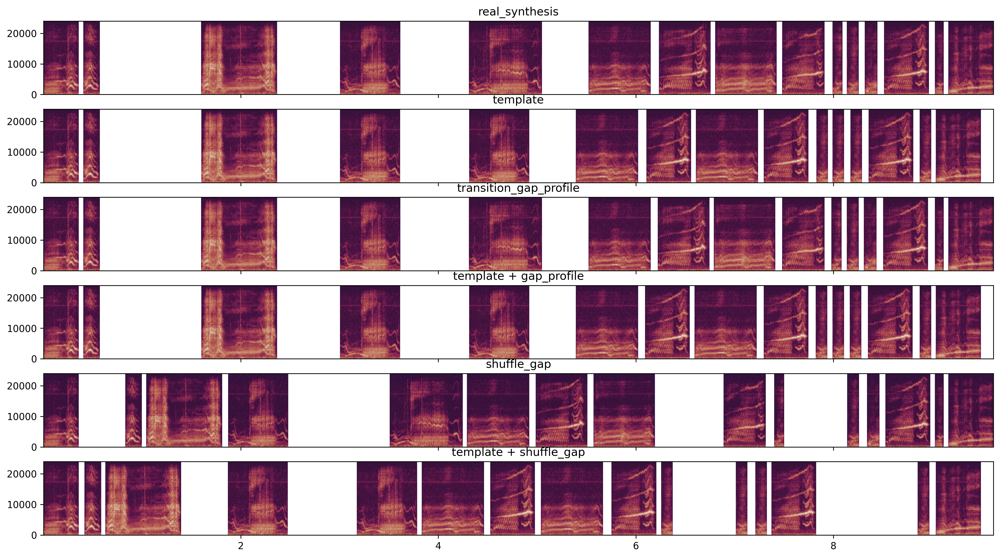

In [23]:
fig, axs = plt.subplots(6, sharex = True, figsize=(18, 10), dpi=300)
axs[0].title.set_text('real_synthesis')
x = axs[0].specgram(real_syn, Fs = 48000, cmap = 'twilight')
axs[1].title.set_text('template')
y = axs[1].specgram(template_syn, Fs = 48000, cmap = 'twilight')
axs[2].title.set_text('transition_gap_profile')
z = axs[2].specgram(avg_syn, Fs = 48000, cmap = 'twilight')
axs[3].title.set_text('template + gap_profile')
a = axs[3].specgram(roeske_syn, Fs = 48000, cmap = 'twilight')
axs[4].title.set_text('shuffle_gap')
a = axs[4].specgram(shuffle_syn, Fs = 48000, cmap = 'twilight')
axs[5].title.set_text('template + shuffle_gap')
a = axs[5].specgram(template_shuffle_syn, Fs = 48000, cmap = 'twilight')

## Save both synthesis

In [24]:
from starling_rhythm.synth import save_synth

In [25]:
from joblib import Parallel, delayed
from tqdm.autonotebook import tqdm
n_jobs = 36
verbose = 0

In [26]:
with Parallel(n_jobs = n_jobs, verbose = verbose) as parallel:
    parallel(
        delayed(save_synth)(
            segment_address,
            syllable_df,
            bID_DIR,
            templating = False,
            gap_type = 'empirical',
            version = 'strict'
        )
        for segment_address in tqdm(seg_list, desc = 'Outputting all real strict syns for b1555')
    )

Outputting all real strict syns for b1555: 100%|██████████| 150/150 [00:35<00:00,  4.18it/s]


In [27]:
with Parallel(n_jobs = n_jobs, verbose = verbose) as parallel:
    parallel(
        delayed(save_synth)(
            segment_address,
            syllable_df,
            bID_DIR,
            templating = True,
            gap_type = 'transition_gap_profiles',
            version = 'strict'
        )
        for segment_address in tqdm(seg_list, desc = 'Outputting all real strict syns for b1555')
    )

Outputting all real strict syns for b1555: 100%|██████████| 150/150 [00:37<00:00,  3.99it/s]
